#Multimodal AI for Reference Circuit Parsing and Analysis

##Overview


### Problem Breakdown
The goal of this project is to automate extraction of **reference circuits** from datasheets, making it easier to identify components, images, and vendor-specific terminologies.

To accomplish this task, we are dealing with two key components:
- **Textual information** (from PDF files)
- **Visual information** (from images embedded in PDFs)


### **Multimodal-Reference Augmented Generation (MM-RAG)**

**MM-RAG** enhances generative models, by integrating multimodal inputs with reference information.

- **Multimodal**: Uses Different types of input data (e.g., text, images, audio) simultaneously.
- **Reference**: Provides context for generation. (e.g., Reference pdf, video, audio inputs)
- **Augmented Generation**: Improved Generation due to multi-modal reference input.



#### **Flow Diagram**

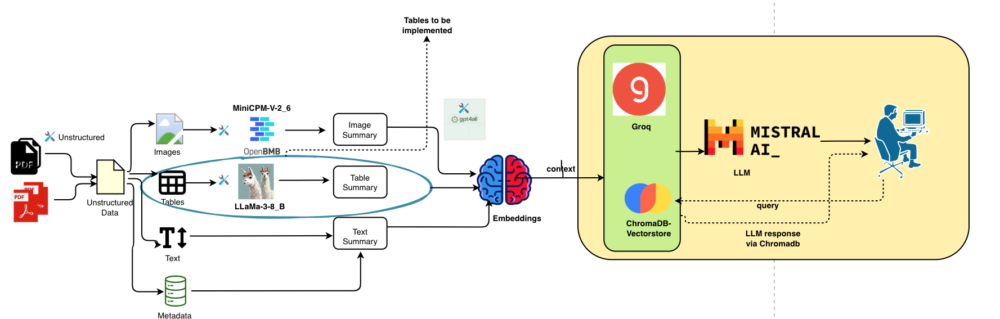

### Why Multimodal Retrieval-Augmented Generation (MM-RAG)?
- Multimodal Data Integration
- Contextual Reference Augmentation
- Cross-Modal Reasoning
- Improved Generation Quality
- Enhanced Retrieval and Generation



### **Key Steps**

- 1. Datasheet Parsing
- 2. Text Extraction with Metadata
- 3. Image Metadata Extraction
- 4. Image Summarization
- 5. Cleanup and Optimization
- 6. Optional Summaries and Insights
- 7. Model Integration and Execution


Key Steps:
-

####Installing OCR dependencies for Python - Tesseract, Unstructured and others

In [ ]:
%%bash

pip -qqq install pdfminer.six
pip -qqq install pillow-heif==0.3.2
pip -qqq install matplotlib
pip -qqq install unstructured-inference

pip -qqq install unstructured-pytesseract
pip -qqq install tesseract-ocr
pip -qqq install unstructured

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 21.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 95.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.0/42.0 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.5/48.5 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.4/48.4 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.2/19.2 MB 63.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 101.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 89.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.2/59.2 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 54.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 63.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 

  ERROR: Failed building wheel for tesseract-ocr
ERROR: ERROR: Failed to build installable wheels for some pyproject.toml based projects (tesseract-ocr)


In [ ]:
%%bash
apt install tesseract-ocr
apt install libtesseract-dev

Reading package lists...
Building dependency tree...
Reading state information...
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 49 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 3s (1,858 kB/s)
Selecting previously unselected package tesseract-ocr-eng.
(Reading database ... 123632 files and directories currently installed.)
Preparing to unpack .../tesseract-ocr-eng_1%3a4.00~gi

In [ ]:
!pip install pi_heif

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 50.2 MB/s eta 0:00:00


In [ ]:
from unstructured.partition.pdf import partition_pdf

In [ ]:
input_path = "/content/data/ncs2.pdf"

In [ ]:
%%bash
sudo apt-get update
apt-get install poppler-utils

Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,190 kB]
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:7 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease [18.1 kB]
Get:8 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:11 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:12 http://security.ubuntu.com/ubuntu jammy-security/universe amd64 Packages [1,225 kB]
Get:13 https://r2u.stat.illi

W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)


#### PDF Extraction

In [ ]:
chunks =partition_pdf(
    filename=input_path,
    strategy="hi_res",
    extract_images_in_pdf=True,
    extract_image_block_to_payload=False,
    extract_image_block_output_dir="/content/data/output/"
    )

In [ ]:
chunks

#### 1. Adding Metadata to Text

In [ ]:
from unstructured.documents.elements import NarrativeText, Text, Title, FigureCaption, ListItem, Text, Header

In [ ]:
def extract_text_with_metadata(raw_extracted_data, source_doc):
    result = []
    page_counts = {}

    for item in raw_extracted_data:
        if type(item) in (NarrativeText, FigureCaption):
            page_number = item.metadata.page_number

            page_counts[page_number] = page_counts.get(page_number, 0) + 1
            para = page_counts[page_number]

            text_content = element.text

            result.append({
                "source_document": source_doc,
                "page_number": page_number,
                "paragraph_number": para,
                "text": text_content
            })


    return result

In [ ]:
extracted_data = extract_text_with_metadata(chunks, input_path)

In [ ]:
extracted_data

[{'source_document': '/content/data/ncs2.pdf',
  'page_number': 1,
  'paragraph_number': 1,
  'text': 'The NCS20161, NCS20162, and NCS20164 are a family of single, dual and quad operational amplifiers (op amps) that provide 8 MHz gain—-bandwidth product while consuming 500 uA of quiescent current per channel. The NCS2016x has an input offset voltage of 0.3 mV and operates from 1.8 V to 5.5 V supply over a wide temperature range (-40°C to 125°C). The rail-to-rail input and output operation allows the use of the entire supply voltage range. Thus, this series of op amps offers superior performance over many industry standard parts. These devices are AEC—Q100 qualified when denoted by the NCV prefix.'},
 {'source_document': '/content/data/ncs2.pdf',
  'page_number': 1,
  'paragraph_number': 2,
  'text': 'With low current consumption and low supply voltage operation in industry standard packages, the NCS20161 series is ideal for sensor signal conditioning and low voltage current sensing app

In [ ]:
# Extract relevant chunks
texts = []
for chunk in chunks:
    if "NarrativeText" in str(type(chunk)) or "FigureCaption" in str(type(chunk)):
        texts.append(chunk)
texts

In [ ]:
# Text summaries
import pandas as pd
df = pd.DataFrame(extracted_data)
text_summaries = df['text'].tolist()
text_summaries

['The NCS20161, NCS20162, and NCS20164 are a family of single, dual and quad operational amplifiers (op amps) that provide 8 MHz gain—-bandwidth product while consuming 500 uA of quiescent current per channel. The NCS2016x has an input offset voltage of 0.3 mV and operates from 1.8 V to 5.5 V supply over a wide temperature range (-40°C to 125°C). The rail-to-rail input and output operation allows the use of the entire supply voltage range. Thus, this series of op amps offers superior performance over many industry standard parts. These devices are AEC—Q100 qualified when denoted by the NCV prefix.',
 'With low current consumption and low supply voltage operation in industry standard packages, the NCS20161 series is ideal for sensor signal conditioning and low voltage current sensing applications in automotive, consumer and industrial markets.',
 'This document contains information on some products that are still under development. onsemi reserves the right to change or discontinue thes

#### Image Extraction

In [ ]:
from unstructured.documents.elements import Image

In [ ]:
def extract_image_metadata(raw_data, source_doc):
    result = []

    for item in raw_data:
        if isinstance(item, Image):
            page_num = item.metadata.page_number
            image_path = item.metadata.image_path if hasattr(item.metadata, 'image_path') else None

            result.append({
                "source_document": source_doc,
                "page_number": page_num,
                "image_path": image_path
            })

    return result


In [ ]:
extracted_image_data = extract_image_metadata(chunks, input_path)

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import math

In [ ]:
#Display Images from Metadata

def display_images_from_metadata(extracted_image_data, images_per_row=4):
    valid_images = [img for img in extracted_image_data if img['image_path']]

    if not valid_images:
        print("No valid image data available.")
        return

    num_images = len(valid_images)
    num_rows = math.ceil(num_images / images_per_row)

    fig, axes = plt.subplots(num_rows, images_per_row, figsize=(20, 5 * num_rows))
    axes = axes.flatten() if num_rows > 1 else [axes]

    for ax, img in zip(axes, valid_images):
        try:
            img_obj = Image.open(img['image_path'])
            ax.imshow(img_obj)
            ax.axis('off')
            ax.set_title(f"Page {img['page_number']}", fontsize=10)
        except Exception as e:
            print(f"Error loading image {img['image_path']}: {str(e)}")
            ax.text(0.5, 0.5, f"Error loading image\n{str(e)}", ha='center', va='center')
            ax.axis('off')

    # Remove unused axes if there are fewer images than the available axes
    for ax in axes[len(valid_images):]:
        fig.delaxes(ax)

    plt.tight_layout()
    plt.show()


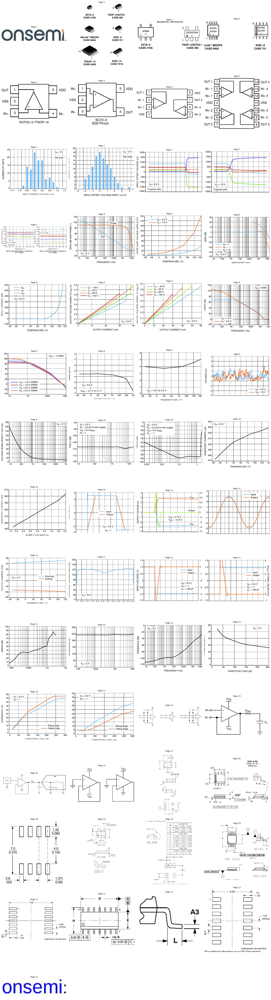

In [ ]:
display_images_from_metadata(extracted_image_data)

#### 3. Image Summarization

In [ ]:
%%bash
  pip -qqq install -qU langchain-openai
  pip -qqq install -qU langchain-google-genai
  pip -qqq install chromadb
  pip -qqq install -qU langchain-community faiss-cpu
  pip -qqq install flash_attn bitsandbytes accelerate -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 59.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.5/27.5 MB 54.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 78.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 122.4/122.4 MB 19.4 MB/s eta 0:00:00


In [ ]:
#Importing Necessary Libraries
from langchain.prompts import PromptTemplate, ChatPromptTemplate
from langchain.chains.summarize import load_summarize_chain
from langchain.vectorstores import DocArrayInMemorySearch
from langchain.schema.document import Document
from langchain.document_loaders import PyPDFLoader, TextLoader
from langchain.text_splitter import TokenTextSplitter, CharacterTextSplitter
from langchain_community.vectorstores import FAISS
from langchain_community.document_loaders import TextLoader
from langchain_community.docstore.in_memory import InMemoryDocstore
from langchain_openai import ChatOpenAI
from transformers import BitsAndBytesConfig, AutoModel, AutoTokenizer
import torch
import faiss
from PIL import Image
import matplotlib.pyplot as plt
from IPython.display import display, Markdown
import chromadb
import os
import requests
import base64


In [ ]:
bnb_config = BitsAndBytesConfig(
    load_in_8bit=True
)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [ ]:
from huggingface_hub import notebook_login
notebook_login()

In [ ]:
#Model
model = AutoModel.from_pretrained('openbmb/MiniCPM-V-2_6',
                                   trust_remote_code=True,
                                   attn_implementation='eager',
                                   torch_dtype=torch.bfloat16,
                                   device_map = "cuda",
                                   quantization_config=bnb_config)

model = model.eval()

tokenizer = AutoTokenizer.from_pretrained('openbmb/MiniCPM-V-2_6', trust_remote_code=True)

config.json:   0%|          | 0.00/1.36k [00:00<?, ?B/s]

configuration_minicpm.py:   0%|          | 0.00/3.28k [00:00<?, ?B/s]

modeling_navit_siglip.py:   0%|          | 0.00/41.8k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-V-2_6:
- modeling_navit_siglip.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-V-2_6:
- configuration_minicpm.py
- modeling_navit_siglip.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_minicpmv.py:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

resampler.py:   0%|          | 0.00/34.7k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-V-2_6:
- resampler.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-V-2_6:
- modeling_minicpmv.py
- resampler.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


model.safetensors.index.json:   0%|          | 0.00/66.8k [00:00<?, ?B/s]

model-00001-of-00004.safetensors:   0%|          | 0.00/4.87G [00:00<?, ?B/s]

model-00002-of-00004.safetensors:   0%|          | 0.00/4.93G [00:00<?, ?B/s]

model-00003-of-00004.safetensors:   0%|          | 0.00/4.33G [00:00<?, ?B/s]

model-00004-of-00004.safetensors:   0%|          | 0.00/2.06G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/121 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/5.64k [00:00<?, ?B/s]

tokenization_minicpmv_fast.py:   0%|          | 0.00/1.66k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-V-2_6:
- tokenization_minicpmv_fast.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


vocab.json:   0%|          | 0.00/2.78M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/1.67M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/7.03M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/3.56k [00:00<?, ?B/s]

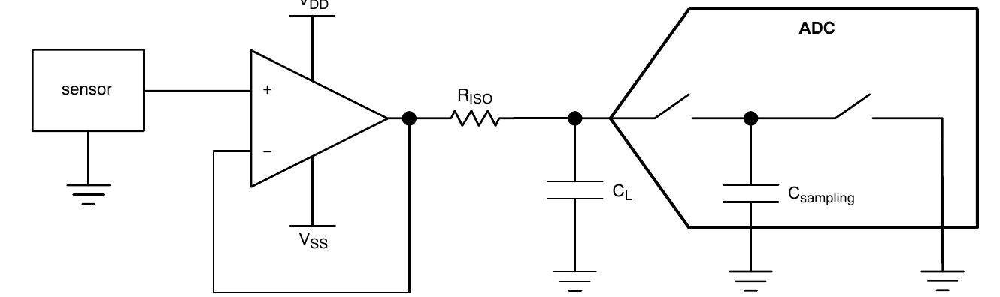

In [ ]:
# Display the image in the IPython environment

from IPython.display import display

image_path = '/content/data/output/figure-15-45.jpg'
image1 = Image.open(image_path)

display(image1)


In [ ]:
#Figure description
from PIL import Image
image1 = Image.open('/content/data/output/figure-15-45.jpg').convert('RGB')

question = """Summarize the key elements of this image, highlighting the main objects,
             their relationships, and any inferences that can be drawn. If it's a reference circuit,
             Mention any naming conventions that may have been coined by companies like
            Texas Instruments, Analog Systems, etc, and find the region in which they're found.
            Contain the description with 6-7 lines."""

msgs = [{'role': 'user', 'content': [image1, question]}]

answer = model.chat(
    image=image1,
    msgs=msgs,
    tokenizer=tokenizer
)

print(answer)


preprocessor_config.json:   0%|          | 0.00/714 [00:00<?, ?B/s]

processing_minicpmv.py:   0%|          | 0.00/10.0k [00:00<?, ?B/s]

image_processing_minicpmv.py:   0%|          | 0.00/16.6k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-V-2_6:
- image_processing_minicpmv.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
A new version of the following files was downloaded from https://huggingface.co/openbmb/MiniCPM-V-2_6:
- processing_minicpmv.py
- image_processing_minicpmv.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.
/usr/local/lib/python3.10/dist-packages/transformers/models/auto/image_processing_auto.py:520: FutureWarning: The image_processor_class argument is deprecated and will be removed in v4.42. Please use `slow_image_processor_class`, or `fast_image_processor_class` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/bitsandbytes/autograd/_functions.py:316: UserWarning: MatMul8bitLt: inputs will 

The key elements components in the reference circuit include:
1. Sensor: The input device that detects physical properties or changes in its environment.
2. Power Supply (VDD and Vss: These these provide the necessary voltage to operate the sensor and ADC respectively,.
3. Op-Amp: An operational amplifier is used here for signal amplification and conditioning before it goes's into the ADC.
4. Riso and CL: These these form a low-pass filter to smooth out noise and high-frequency signals from the sensor output.
5. ADC: Analog-to-Digital Converter, converts the analog signal received from the sensor into digital format for processing.

### Relationship and Inferences
- **Signal Conditioning:** The op-ampm and the associated resistors and capacitor create a preamplifier which conditions the sensor’s output signal by filtering out high-frequency noise and amplifying the desired signal.
- **ADC Integration:** The ADC block integrates with the preamplified signal to digitize it so data for fu

In [ ]:
!nvidia-smi

Wed Dec  4 17:40:10 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   66C    P0              32W /  70W |   9821MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import gc

#Delete Cache
def delete_unused_tensors():
    for name, obj in list(globals().items()):
        if isinstance(obj, torch.Tensor):
            if obj.is_cuda:
                print(f"Deleting tensor {name} with shape {obj.size()} on {obj.device}")
                del obj  # Delete the tensor (remove reference)
                torch.cuda.empty_cache()  # Clear GPU memory
            else:
                print(f"Tensor {name} is not on GPU, skipping deletion.")

    gc.collect()
    torch.cuda.empty_cache()

delete_unused_tensors()

In [ ]:
gc.collect()

In [ ]:
image_summarizer_prompt = """Summarize the key elements of this image, highlighting the main objects,
             their relationships, and any inferences that can be drawn. If it's a reference circuit,
             Mention any naming conventions that may have been coined by companies like
            Texas Instruments, Analog Systems, etc, and find the region in which they're found.
            Contain the description within 3-4 lines."""


#### Image Metadata Summarization

In [ ]:
def extract_image_metadata_with_summary(raw_extracted_data, input_path, summarizer_prompt):
    image_data = []

    # Determine whether to use GPU or CPU
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Iterate over the extracted data chunks
    for element in raw_extracted_data:
        if "Image" in str(type(element)):  # Check if the element is an image
            image_path = element.metadata.image_path if hasattr(element.metadata, 'image_path') else None
            page_number = element.metadata.page_number if hasattr(element.metadata, 'page_number') else None

            if image_path and os.path.exists(image_path):
                image = Image.open(str(image_path)).convert('RGB')

                # Resize image to reduce GPU load
                image = image.resize((image.width // 2, image.height // 2))

                msgs = [{'role': 'user', 'content': [image, summarizer_prompt]}]
                answer = model.chat(image=image, msgs=msgs, tokenizer=tokenizer)

                with open(image_path, "rb") as image_file:
                    encoded_string = base64.b64encode(image_file.read()).decode('utf-8')
                image_data.append({
                    "source_document": input_path,
                    "page_number": page_number,
                    "image_path": image_path,
                    "description": answer,
                    "base64_encoding": encoded_string
                })
            else:
                print(f"Warning: Image file not found or path not available for image on page {page_number}")

    return image_data


In [ ]:
extracted_image_metadata = extract_image_metadata_with_summary(chunks, input_path, image_summarizer_prompt)

/usr/local/lib/python3.10/dist-packages/bitsandbytes/autograd/_functions.py:316: UserWarning: MatMul8bitLt: inputs will be cast from torch.bfloat16 to float16 during quantization
  warnings.warn(f"MatMul8bitLt: inputs will be cast from {A.dtype} to float16 during quantization")


In [ ]:
extracted_image_metadata

[{'source_document': '/content/data/ncs2.pdf',
  'page_number': 1,
  'image_path': '/content/data/output/figure-1-1.jpg',
  'description': 'The image features a logo with the text "onsemi" in lowercase letters. The font is sans-serif, modern and clean, which suggests a contemporary and tech-oriented brand identity. Onsemi is known to be a semiconductor company that provides components and system solutions for various industries including automotive, communications, industrial, and computing.\nTexas Instruments ( Analog Systems are some of the companies names that have been coined by these companies. Texas Instruments, for instance, is an American multinational corporation that designs and manufactures semiconductors integrated circuits ( and other systems on a scale of microcontrollers, analog circuits, digital signal processors, power management integrated circuits, radio-frequency integrated circuits, sensors and wireless technologies. These are located in Dallas, Texas, United State

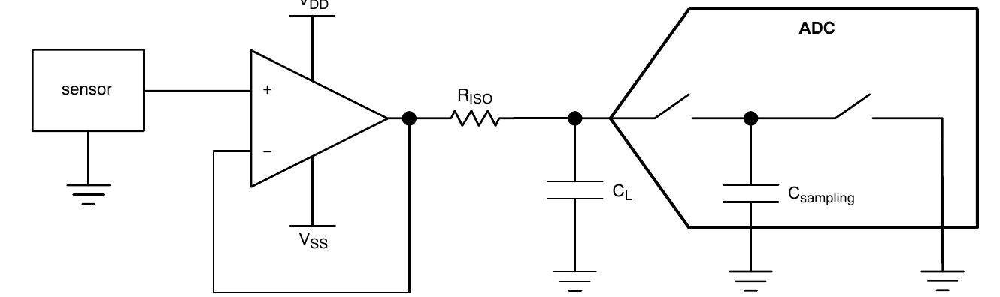

In [ ]:
from IPython.display import display

image_path = '/content/data/output/figure-15-45.jpg'
image1 = Image.open(image_path)

# Display the image in the IPython environment
display(image1)


In [ ]:
fig_42_details = extracted_image_metadata[44]['description']
fig_42_details

'The diagram represents a simple of an instrumentation amplifier circuit, which is typically used to amplify small signals from sensors. The sensor\'s output is connected fed into the non-inverting input (+) of the operational amplifier ( (op). The feedback network, composed of resistor Riso and capacitor CL, stabilizes the gain ratio the op-amp is configured in a differential mode. This setup is commonly found in applications as part of analog-to digital converters (ADCs, where it can be used for sampling purposes.\n            Texas Instruments and Analog Devices are known companies that have coined terms like "operational amplifier" and "analog-to-digital converter", respectively, these they are widely recognized by engineers and designers within the field of electronics and signal processing.'

In [ ]:
# images_summarizer_prompt="""Analyze and identify the image, and provide its detailed description.
#                           If its a reference circuit, provide detailed description of its content, (e.g., schematics, block diagrams, PCB layouts),
#                           and highlight any naming conventions used by vendors like Texas Instruments or Analog Devices.
#                           Locate and describe the exact regions where these reference circuits are found.
#                           For any graphs or charts present, describe their axes, key data points, and trends, and explain the specific features the graph indicates."""

#### Base-64 Images and Image Summaries

In [ ]:
import pandas as pd
df = pd.DataFrame(extracted_image_metadata)
images = df['base64_encoding'].tolist()
print(images)

['/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCABMAVsDASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4uPk5ebn6Onq8vP09fb3+Pn6/9oADAMBAAIRAxEAPwD3+iivJPG3xUeKaXTfDrqNhKy3uAee4j7f8C/LsaaVxNpHp9/qun6XH5l/fW9qp6GaQLn6Z61z83xL8IwuUOrhmHXZBIw/MLg1883N1cXlw9xdTyTTOctJIxZj9SaSKCafPlRSSY67FJxV8hnzs+jrT4g+FL19sWtQKf8Aps

In [ ]:
import pandas as pd
df = pd.DataFrame(extracted_image_metadata)
image_summaries = df['description'].tolist()
print(image_summaries)

['The image features a logo with the text "onsemi" in lowercase letters. The font is sans-serif, modern and clean, which suggests a contemporary and tech-oriented brand identity. Onsemi is known to be a semiconductor company that provides components and system solutions for various industries including automotive, communications, industrial, and computing.\nTexas Instruments ( Analog Systems are some of the companies names that have been coined by these companies. Texas Instruments, for instance, is an American multinational corporation that designs and manufactures semiconductors integrated circuits ( and other systems on a scale of microcontrollers, analog circuits, digital signal processors, power management integrated circuits, radio-frequency integrated circuits, sensors and wireless technologies. These are located in Dallas, Texas, United States.', "The image depicts various types of integrated circuit packages, each labeled with a reference number and the specific case type used

### VectorStore with Chroma

In [ ]:
%%bash
  pip -qqq install -qU langchain-nvidia-ai-endpoints
  pip -qqq install langchain-community
  pip -qqq install chromadb
  pip -qqq install gpt4all
  pip -qqq install langchain-cohere

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.1/41.1 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 93.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 82.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 56.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 409.5/409.5 kB 36.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.5/49.5 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.3/67.3 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 628.3/628.3 kB 43.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 94.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.6/278.6 kB 25.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.8/94.8 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 77.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.2/93.2 kB 1

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.17.1 requires protobuf!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.20.3, but you have protobuf 5.29.1 which is incompatible.
tensorflow-metadata 1.13.1 requires protobuf<5,>=3.20.3, but you have protobuf 5.29.1 which is incompatible.


In [ ]:
#Defining api-keys
os.environ["OPENAI_API_KEY"] = "sk-..."
os.environ["LANGCHAIN_API_KEY"] = "lsv...."
os.environ["GROQ_API_KEY"]="gsk..."
os.environ["LANGCHAIN_TRACING_V2"] = "true"
os.environ["LANGCHAIN_PROJECT"]="Test"
os.environ["LANGCHAIN_ENDPOINT"]="https://api.smith.langchain.com"

In [ ]:
#Initialising Vectorstore and Retriever
import langchain
import uuid
from langchain.vectorstores import Chroma
from langchain.storage import InMemoryStore
from langchain.schema.document import Document
from langchain.embeddings import GPT4AllEmbeddings
from langchain.retrievers.multi_vector import MultiVectorRetriever

# The vectorstore to use to index the child chunks
vectorstore = Chroma(collection_name="assn_rag", embedding_function=GPT4AllEmbeddings())

# The storage layer for the parent documents
store = InMemoryStore()
id_key = "doc_id"

# The retriever (empty to start)
retriever = MultiVectorRetriever(
    vectorstore=vectorstore,
    docstore=store,
    id_key=id_key,
)

In [ ]:
# Add texts
doc_ids = [str(uuid.uuid4()) for _ in texts]
summary_texts = [
    Document(page_content=summary, metadata={id_key: doc_ids[i]}) for i, summary in enumerate(text_summaries)
]
retriever.vectorstore.add_documents(summary_texts)
retriever.docstore.mset(list(zip(doc_ids, texts)))

# Add image summaries
img_ids = [str(uuid.uuid4()) for _ in images]
summary_img = [
    Document(page_content=summary, metadata={id_key: img_ids[i]}) for i, summary in enumerate(image_summaries)
]
retriever.vectorstore.add_documents(summary_img)
retriever.docstore.mset(list(zip(img_ids, images)))

In [ ]:
# Retrieve
docs = retriever.invoke(
    "explain reference circuits?"
)

In [ ]:
for doc in docs:
    print(str(doc) + "\n\n" + "-" * 80)

/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAgGBgcGBQgHBwcJCQgKDBQNDAsLDBkSEw8UHRofHh0aHBwgJC4nICIsIxwcKDcpLDAxNDQ0Hyc5PTgyPC4zNDL/2wBDAQkJCQwLDBgNDRgyIRwhMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjIyMjL/wAARCAE+AjADASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4uPk5ebn6Onq8vP09fb3+Pn6/9oADAMBAAIRAxEAPwD3+iiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKoa5YTapoV9Y211NaXE8DJFcQyFHicj5WBHIwcVfooA5D4aa/ca/4JtXvmY6nZM1lfBzlhNGdp3e5GCfrVDwRf33iPxd4n15ry4bSIpxp2n2/

### RAG Pipeline

This is the rag pipeline.

In [ ]:
%%bash
  pip -qqq install -qU langchain-groq

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.8/108.8 kB 9.7 MB/s eta 0:00:00


In [ ]:
from langchain_openai import ChatOpenAI
from langchain_core.prompts import ChatPromptTemplate
from langchain_core.output_parsers import StrOutputParser
from langchain_core.runnables import RunnablePassthrough, RunnableLambda
from langchain_core.messages import SystemMessage, HumanMessage
from langchain_groq import ChatGroq
from base64 import b64decode

In [ ]:
#Reduce context size
def summarize_text(text, max_length=500):
    if len(text) > max_length:
        return text[:max_length] + "..."
    return text

In [ ]:
def extract_data_from_docs(documents):
    """Separate text and base64-encoded image data"""
    image_data = []
    text_data = []

    for document in documents:
        try:
            b64decode(document)
            image_data.append(document)  # If successful, it's an image
        except Exception:
            text_data.append(document)  # If error occurs, it's treated as text

    return {"images": image_data, "texts": text_data}


In [ ]:
model = ChatGroq(
    model="mixtral-8x7b-32768",
    temperature=0,
    max_tokens=None,
    timeout=None,
    max_retries=2
)

In [ ]:
def generate_prompt(kwargs):

    docs_by_type = kwargs["context"]
    user_question = kwargs["question"]

    context_text = ""
    if len(docs_by_type["texts"]) > 0:
        for text_element in docs_by_type["texts"]:
            context_text += text_element.text

    # construct prompt with context (including images)
    prompt_template = f"""
    Answer the question based only on the following context, which can include text, tables, and the below image.
    Context: {context_text}
    Question: {user_question}
    """

    prompt_content = [{"type": "text", "text": prompt_template}]

    if len(docs_by_type["images"]) > 0:
        for image in docs_by_type["images"]:
            prompt_content.append(
                {
                    "type": "image_url",
                    "image_url": {"url": f"data:image/jpeg;base64,{image}"},
                }
            )

    return ChatPromptTemplate.from_messages(
        [
            HumanMessage(content=prompt_content),
        ]
    )

In [ ]:

template = """Answer the question based only on the following context. It can be an image, a bar graph, a chart, a reference circuit, etc.:

{context}

Question: {question}
"""

prompt = ChatPromptTemplate.from_template(template)
model = ChatGroq(
    model="mixtral-8x7b-32768",
    temperature=0,
    max_tokens=None,
    timeout=None,
    max_retries=2
)

chain = (
    {
        "context": retriever | RunnableLambda(extract_data_from_docs),
        "question": RunnablePassthrough(),
    }
    | RunnableLambda(generate_prompt)
    | model
    | StrOutputParser()
)

response = chain.invoke("Explain figure 42. What is it about?")
print(response)


╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <cell line: 24>:24                                                                            │
│                                                                                                  │
│ /usr/local/lib/python3.10/dist-packages/langchain_core/runnables/base.py:3024 in invoke          │
│                                                                                                  │
│   3021 │   │   │   │   if i == 0:                                                                │
│   3022 │   │   │   │   │   input = context.run(step.invoke, input, config, **kwargs)             │
│   3023 │   │   │   │   else:                                                                     │
│ ❱ 3024 │   │   │   │   │   input = context.run(step.invoke, input, config)                       │
│   3025 │   │   # finish the root run                                                             │
│   3026 │   │   except BaseException as e:                                                        │
│   3027 │   │   │   run_manager.on_chain_error(e)                                                 │
│                                                                                                  │
│ /usr/local/lib/python3.10/dist-packages/langchain_core/language_models/chat_models.py:286 in     │
│ invoke                                                                                           │
│                                                                                                  │
│    283 │   │   config = ensure_config(config)                                                    │
│    284 │   │   return cast(                                                                      │
│    285 │   │   │   ChatGeneration,                                                               │
│ ❱  286 │   │   │   self.generate_prompt(                                                         │
│    287 │   │   │   │   [self._convert_input(input)],                                             │
│    288 │   │   │   │   stop=stop,                                                                │
│    289 │   │   │   │   callbacks=config.get("callbacks"),                                        │
│                                                                                                  │
│ /usr/local/lib/python3.10/dist-packages/langchain_core/language_models/chat_models.py:786 in     │
│ generate_prompt                                                                                  │
│                                                                                                  │
│    783 │   │   **kwargs: Any,                                                                    │
│    784 │   ) -> LLMResult:                                                                       │
│    785 │   │   prompt_messages = [p.to_messages() for p in prompts]                              │
│ ❱  786 │   │   return self.generate(prompt_messages, stop=stop, callbacks=callbacks, **kwargs)   │
│    787 │                                                                                         │
│    788 │   async def agenerate_prompt(                                                           │
│    789 │   │   self,                                                                             │
│                                                                                                  │
│ /usr/local/lib/python3.10/dist-packages/langchain_core/language_models/chat_models.py:643 in     │
│ generate                                                                                         │
│                                                                                                  │
│    640 │   │   │   except BaseException as e:                                                    │
│    641 │   │   │   │   if run_managers:                    